In [6]:
using Plots
using LinearAlgebra
using Random
using FFTW
using Statistics

In [53]:

# Parameters
N = 20000               # Samples
Dt = 1e-9               # Time step [s]
x0 = 0                  # Initial position [m]
v0 = 0                  # Initial velocity [m/s]
R = 1e-6                # Particle radius [m]
T = 300                 # Temperature [K]
η = 0.001               # Fluid Viscosity [Pa s] (water)
kx = 1e-6               # Spring stiffness [N/m]
kB = 1.38e-23           # Boltzmann constant [J/K]
γ = 6*π*R*η             # Friction coefficient
D = kB*T/γ              # Diffusion coefficient
ρ = 1050                # Density of particle [kg/m^3] (polystyrene)
m = 4/3*π*R^3*ρ         # Mass of particle [kg]

4.3982297150257095e-15

In [ ]:

function particle_trap_overdamped(x_prev, Dt, kx, γ, D)
    # Gives the effect of the spring on the particle (established by the overdamped Langevin equation)
    drift = -(kx/γ)*x_prev*Dt
    # Gives the thermal noise term due to random variation in the trap (established by the Langevin equation)
    noise = sqrt(2*D*Dt)*randn()
    return x_prev+drift+noise
end

function particle_trap_inertial(x_prev, v_prev, Dt, kx, γ, m, T)
    # Gives the thermal noise term due to random variation in the trap (established by the Langevin equation)
    noise = sqrt(2*γ*kB*T/m^2*Dt) * randn() 
    # Gives the new velocity of the particle using the sitffness of the trap, and the resistance of the medium (then adds the noise)
    # Values are negative as a positive x is pushed 'back' by the trap and a positive velocity is resisted
    v_new = v_prev - (kx/m)*x_prev*Dt - (γ/m)*v_prev*Dt + noise
    # Finds the new location of the particle by taking the previous location and multiplying the previous velocity by the time step
    # The previous velocity is used since thats the one that the particle has been travelling at up to the new step
    x_new = x_prev + v_prev*Dt
    return x_new, v_new
end

# Initialize non-inertial model
x_overdamped = zeros(N)
x_overdamped[1] = x0

# Initialize inertial model
x_inertial = zeros(N)
v_inertial = zeros(N)
x_inertial[1] = x0
v_inertial[1] = v0

# Running both simulations
for i in 2:N
    
    # Overdamped simulation
    x_overdamped[i] = particle_trap_overdamped(x_overdamped[i-1], Dt, kx, γ, D)

    # Inertial simulation
    x_inertial[i], v_inertial[i] = particle_trap_inertial(x_inertial[i-1],v_inertial[i-1],Dt,kx,γ,m,T)

end

t = (0:(N-1)) .*Dt

plot(t, x_overdamped, label = "Overdamped")
plot!(t, x_inertial, label = "Inertial")
xlabel!("t [s]")
ylabel!("x [m]")
title!("Optical Trap: Inertial vs. Overdamped Models")
# savefig("Optical Trap")

"c:\\Users\\rdber\\OneDrive\\Desktop\\MENG 451\\Semester Project\\Optical Trap(5).png"

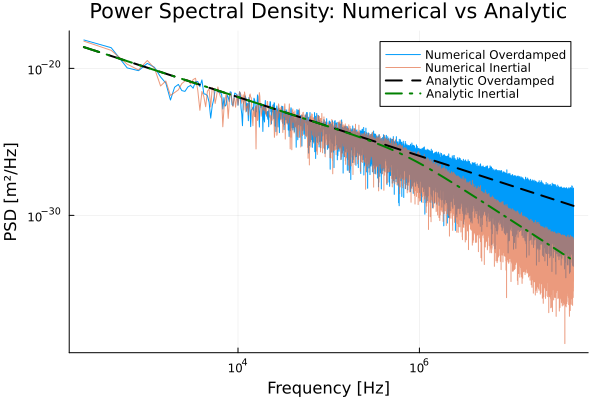

In [18]:

function simulate_traps(N, Dt)

    # Storage
    x_over = zeros(Float64, N)
    x_inert = zeros(Float64, N)
    v_inert = zeros(Float64, N)

    # Initial Conditions
    x_over[1] = 0
    v_inert[1] = 0
    x_inert[1] = 0
    
    for i in 2:N
        # Overdamped 
        drift = -(kx/γ)*x_over[i-1]*Dt
        noise_over = sqrt(2*D*Dt)*randn()
        x_over[i] = x_over[i-1]+drift+noise_over

        # Inertial
        noise_in = sqrt(2*γ*kB*T*Dt)/m *randn()
        v_new = v_inert[i-1]- (kx/m)*x_inert[i-1]*Dt - (γ/m)*v_inert[i-1]*Dt + noise_in
        x_new = x_inert[i-1]+v_inert[i-1]*Dt

        x_inert[i] = x_new
        v_inert[i] = v_new

    end
    return x_over, x_inert, v_inert, γ, m 
end

function window_signal(x)
    x_d = x .- mean(x)                                  # Remove DC component
    N = length(x)
    w = 0.5 .* (1 .- cos.(2*π .* (0:N-1) ./ (N-1)))      # Hann window
    return x_d .* w
end

function compute_psd(x, Dt)
    N = length(x)
    fs = 1/Dt 
    df = fs/N

    xw = window_signal(x)

    Xf = fft(xw)
    Pxx = (2*Dt/N) .* abs.(Xf).^2           # One-sided PSD

    freqs = (0:div(N, 2)) .* df

    # REMOVE ZERO FREQUENCY for log-scale plotting
    return freqs[2:end], Pxx[2:length(freqs)]
end

# Analytic PSDs
function analytic_psd_overdamped(f, kx, γ, kB, T)
    fc = kx / (2π*γ)
    return (2*kB*T/γ) ./ ((2π*fc)^2 .+ (2π*f).^2)
end

function analytic_psd_inertial(f, kx, γ, m, kB, T)
    ω = 2π .* f
    numerator = 2*γ*kB*T
    denominator = (kx .- m .* ω.^2).^2 .+ (γ .* ω).^2
    return numerator ./ denominator
end

function plot_psd(N, Dt)
    # Simulate
    x_over, x_inert, v_inert, γ, m = simulate_traps(N, Dt)

    # Numerical PSD
    f_over, P_over   = compute_psd(x_over, Dt)
    f_inert, P_inert = compute_psd(x_inert, Dt)

    # Analytic PSDs (use same frequency grid)
    P_over_analytic  = analytic_psd_overdamped(f_over, kx, γ, kB, T)
    P_inert_analytic = analytic_psd_inertial(f_inert, kx, γ, m, kB, T)

    # Plot
    p = plot(xscale=:log10, yscale=:log10,
             xlabel="Frequency [Hz]", ylabel="PSD [m²/Hz]",
             title="Power Spectral Density: Numerical vs Analytic",
             legend=:topright)

    # Numerical PSDs
    plot!(p, f_over,  P_over,          label="Numerical Overdamped")
    plot!(p, f_inert, P_inert, alpha=0.7, label="Numerical Inertial")

    # Analytic PSDs
    plot!(p, f_over,  P_over_analytic,  lw=2, ls=:dash, color=:black,
          label="Analytic Overdamped")
    plot!(p, f_inert, P_inert_analytic, lw=2, ls=:dashdot, color=:green,
          label="Analytic Inertial")

    return p
end


N = 500_000
Dt = 1e-8

p = plot_psd(N, Dt)
display(p)
# savefig("Power Spectral Density")

In [ ]:
N = 50000000
Dt = 1e-8

x_over, x_inert, v_inert, γ, m = simulate_traps(N, Dt)

histogram(xlabel = "Displacement [m]", ylabel = "Frequency",
          title = "Histogram of Displacement",legend =:topright)
histogram!(x_over, label = "Overdamped")
histogram!(x_inert, label = "Inertial")

#savefig("Diplacement Histogram")

"c:\\Users\\rdber\\OneDrive\\Desktop\\MENG 451\\Semester Project\\Diplacement Histogram 1.png"